In [1]:
import numpy as np 
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

In [2]:
df=pd.read_csv('kc_house_data.csv')
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,20141013T000000,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,20141209T000000,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,20150225T000000,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,20141209T000000,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,20150218T000000,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,20140521T000000,360000.0,3,2.50,1530,1131,3.0,0,0,...,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,20150223T000000,400000.0,4,2.50,2310,5813,2.0,0,0,...,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,20140623T000000,402101.0,2,0.75,1020,1350,2.0,0,0,...,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,20150116T000000,400000.0,3,2.50,1600,2388,2.0,0,0,...,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287


In [3]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   id             21613 non-null  int64  
 1   date           21613 non-null  object 
 2   price          21613 non-null  float64
 3   bedrooms       21613 non-null  int64  
 4   bathrooms      21613 non-null  float64
 5   sqft_living    21613 non-null  int64  
 6   sqft_lot       21613 non-null  int64  
 7   floors         21613 non-null  float64
 8   waterfront     21613 non-null  int64  
 9   view           21613 non-null  int64  
 10  condition      21613 non-null  int64  
 11  grade          21613 non-null  int64  
 12  sqft_above     21613 non-null  int64  
 13  sqft_basement  21613 non-null  int64  
 14  yr_built       21613 non-null  int64  
 15  yr_renovated   21613 non-null  int64  
 16  zipcode        21613 non-null  int64  
 17  lat            21613 non-null  float64
 18  long  

| Kolom             | Keterangan                                                                         |
| ----------------- | ---------------------------------------------------------------------------------- |
| **id**            | ID unik tiap rumah (bisa jadi primary key). Biasanya tidak dipakai untuk prediksi. |
| **date**          | Tanggal penjualan rumah. Bisa diubah jadi variabel waktu (tahun, bulan, hari).     |
| **price**         | Harga rumah (variabel target kalau prediksi harga).                                |
| **bedrooms**      | Jumlah kamar tidur.                                                                |
| **bathrooms**     | Jumlah kamar mandi.                                                                |
| **sqft_living**   | Luas bangunan rumah (ft²).                                                         |
| **sqft_lot**      | Luas tanah (ft²).                                                                  |
| **floors**        | Jumlah lantai.                                                                     |
| **waterfront**    | Ada view tepi air / laut (0 = tidak, 1 = ya).                                      |
| **view**          | Kualitas view rumah (0–4).                                                         |
| **condition**     | Kondisi rumah (1–5, makin tinggi makin bagus).                                     |
| **grade**         | Kualitas desain/finish rumah (1–13).                                               |
| **sqft_above**    | Luas bangunan di atas tanah (ft²).                                                 |
| **sqft_basement** | Luas basement (ft²).                                                               |
| **yr_built**      | Tahun rumah dibangun.                                                              |
| **yr_renovated**  | Tahun terakhir renovasi. 0 artinya tidak pernah renovasi.                          |
| **zipcode**       | Kode pos lokasi rumah.                                                             |
| **lat**           | Latitude lokasi rumah.                                                             |
| **long**          | Longitude lokasi rumah.                                                            |
| **sqft_living15** | Rata-rata luas living area rumah tetangga.                                         |
| **sqft_lot15**    | Rata-rata luas tanah rumah tetangga.                                               |


In [4]:
df.describe()

,id,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
count,2.161300e+04,2.161300e+04,21613.000000,21613.000000,21613.000000,2.161300e+04,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000,21613.000000
mean,4.580302e+09,5.400881e+05,3.370842,2.114757,2079.899736,1.510697e+04,1.494309,0.007542,0.234303,3.409430,7.656873,1788.390691,291.509045,1971.005136,84.402258,98077.939805,47.560053,-122.213896,1986.552492,12768.455652
std,2.876566e+09,3.671272e+05,0.930062,0.770163,918.440897,4.142051e+04,0.539989,0.086517,0.766318,0.650743,1.175459,828.090978,442.575043,29.373411,401.679240,53.505026,0.138564,0.140828,685.391304,27304.179631
min,1.000102e+06,7.500000e+04,0.000000,0.000000,290.000000,5.200000e+02,1.000000,0.000000,0.000000,1.000000,1.000000,290.000000,0.000000,1900.000000,0.000000,98001.000000,47.155900,-122.519000,399.000000,651.000000
25%,2.123049e+09,3.219500e+05,3.000000,1.750000,1427.000000,5.040000e+03,1.000000,0.000000,0.000000,3.000000,7.000000,1190.000000,0.000000,1951.000000,0.000000,98033.000000,47.471000,-122.328000,1490.000000,5100.000000
50%,3.904930e+09,4.500000e+05,3.000000,2.250000,1910.000000,7.618000e+03,1.500000,0.000000,0.000000,3.000000,7.000000,1560.000000,0.000000,1975.000000,0.000000,98065.000000,47.571800,-122.230000,1840.000000,7620.000000
75%,7.308900e+09,6.450000e+05,4.000000,2.500000,2550.000000,1.068800e+04,2.000000,0.000000,0.000000,4.000000,8.000000,2210.000000,560.000000,1997.000000,0.000000,98118.000000,47.678000,-122.125000,2360.000000,10083.000000
max,9.900000e+09,7.700000e+06,33.000000,8.000000,13540.000000,1.651359e+06,3.500000,1.000000,4.000000,5.000000,13.000000,9410.000000,4820.000000,2015.000000,2015.000000,98199.000000,47.777600,-121.315000,6210.000000,871200.000000


In [5]:
df.isnull().sum()

id               0
date             0
price            0
bedrooms         0
bathrooms        0
sqft_living      0
sqft_lot         0
floors           0
waterfront       0
view             0
condition        0
grade            0
sqft_above       0
sqft_basement    0
yr_built         0
yr_renovated     0
zipcode          0
lat              0
long             0
sqft_living15    0
sqft_lot15       0
dtype: int64

In [6]:
df.duplicated().sum()

np.int64(0)

In [7]:
df.nunique()

id               21436
date               372
price             4028
bedrooms            13
bathrooms           30
sqft_living       1038
sqft_lot          9782
floors               6
waterfront           2
view                 5
condition            5
grade               12
sqft_above         946
sqft_basement      306
yr_built           116
yr_renovated        70
zipcode             70
lat               5034
long               752
sqft_living15      777
sqft_lot15        8689
dtype: int64

# 2 Data Preparation

In [8]:
# Ubah tipe datetime 

In [9]:
df['date'] = pd.to_datetime(df['date'])
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,grade,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,7,1180,0,1955,0,98178,47.5112,-122.257,1340,5650
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,7,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,6,770,0,1933,0,98028,47.7379,-122.233,2720,8062
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,7,1050,910,1965,0,98136,47.5208,-122.393,1360,5000
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,8,1680,0,1987,0,98074,47.6168,-122.045,1800,7503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,2014-05-21,360000.0,3,2.50,1530,1131,3.0,0,0,...,8,1530,0,2009,0,98103,47.6993,-122.346,1530,1509
21609,6600060120,2015-02-23,400000.0,4,2.50,2310,5813,2.0,0,0,...,8,2310,0,2014,0,98146,47.5107,-122.362,1830,7200
21610,1523300141,2014-06-23,402101.0,2,0.75,1020,1350,2.0,0,0,...,7,1020,0,2009,0,98144,47.5944,-122.299,1020,2007
21611,291310100,2015-01-16,400000.0,3,2.50,1600,2388,2.0,0,0,...,8,1600,0,2004,0,98027,47.5345,-122.069,1410,1287


In [10]:
#Cari tau usia rumah yang mengalami renovasi, tanda 0 menandakan bahwa rumah tersebut tidak mengalami renovasi

df['yr_renovated'].value_counts()

yr_renovated
0       20699
2014       91
2013       37
2003       36
2005       35
        ...  
1948        1
1951        1
1959        1
1934        1
1944        1
Name: count, Length: 70, dtype: int64

In [11]:
df['age_since_renovation'] =  df['date'].dt.year - np.where(df['yr_renovated'] == 0, df['yr_built'], df['yr_renovated'])
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_above,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age_since_renovation
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,1180,0,1955,0,98178,47.5112,-122.257,1340,5650,59
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,2170,400,1951,1991,98125,47.7210,-122.319,1690,7639,23
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,770,0,1933,0,98028,47.7379,-122.233,2720,8062,82
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,1050,910,1965,0,98136,47.5208,-122.393,1360,5000,49
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,1680,0,1987,0,98074,47.6168,-122.045,1800,7503,28
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,2014-05-21,360000.0,3,2.50,1530,1131,3.0,0,0,...,1530,0,2009,0,98103,47.6993,-122.346,1530,1509,5
21609,6600060120,2015-02-23,400000.0,4,2.50,2310,5813,2.0,0,0,...,2310,0,2014,0,98146,47.5107,-122.362,1830,7200,1
21610,1523300141,2014-06-23,402101.0,2,0.75,1020,1350,2.0,0,0,...,1020,0,2009,0,98144,47.5944,-122.299,1020,2007,5
21611,291310100,2015-01-16,400000.0,3,2.50,1600,2388,2.0,0,0,...,1600,0,2004,0,98027,47.5345,-122.069,1410,1287,11


In [12]:
# indikator pernah renovasi
df['is_renovated'] = (df['yr_renovated'] != 0).astype(int)
df

,id,date,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,...,sqft_basement,yr_built,yr_renovated,zipcode,lat,long,sqft_living15,sqft_lot15,age_since_renovation,is_renovated
0,7129300520,2014-10-13,221900.0,3,1.00,1180,5650,1.0,0,0,...,0,1955,0,98178,47.5112,-122.257,1340,5650,59,0
1,6414100192,2014-12-09,538000.0,3,2.25,2570,7242,2.0,0,0,...,400,1951,1991,98125,47.7210,-122.319,1690,7639,23,1
2,5631500400,2015-02-25,180000.0,2,1.00,770,10000,1.0,0,0,...,0,1933,0,98028,47.7379,-122.233,2720,8062,82,0
3,2487200875,2014-12-09,604000.0,4,3.00,1960,5000,1.0,0,0,...,910,1965,0,98136,47.5208,-122.393,1360,5000,49,0
4,1954400510,2015-02-18,510000.0,3,2.00,1680,8080,1.0,0,0,...,0,1987,0,98074,47.6168,-122.045,1800,7503,28,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,263000018,2014-05-21,360000.0,3,2.50,1530,1131,3.0,0,0,...,0,2009,0,98103,47.6993,-122.346,1530,1509,5,0
21609,6600060120,2015-02-23,400000.0,4,2.50,2310,5813,2.0,0,0,...,0,2014,0,98146,47.5107,-122.362,1830,7200,1,0
21610,1523300141,2014-06-23,402101.0,2,0.75,1020,1350,2.0,0,0,...,0,2009,0,98144,47.5944,-122.299,1020,2007,5,0
21611,291310100,2015-01-16,400000.0,3,2.50,1600,2388,2.0,0,0,...,0,2004,0,98027,47.5345,-122.069,1410,1287,11,0


In [ ]:
# Drop beberapa kolom yang gak terpakai
df.drop(columns=['id', 'date', 'yr_renovated', 'yr_built', 'zipcode'], inplace=True)

df


,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,age_since_renovation,is_renovated
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,47.5112,-122.257,1340,5650,59,0
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,47.7210,-122.319,1690,7639,23,1
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,47.7379,-122.233,2720,8062,82,0
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,47.5208,-122.393,1360,5000,49,0
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,47.6168,-122.045,1800,7503,28,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,47.6993,-122.346,1530,1509,5,0
21609,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,47.5107,-122.362,1830,7200,1,0
21610,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,47.5944,-122.299,1020,2007,5,0
21611,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,47.5345,-122.069,1410,1287,11,0


In [14]:
df.nunique()

price                   4028
bedrooms                  13
bathrooms                 30
sqft_living             1038
sqft_lot                9782
floors                     6
waterfront                 2
view                       5
condition                  5
grade                     12
sqft_above               946
sqft_basement            306
lat                     5034
long                     752
sqft_living15            777
sqft_lot15              8689
age_since_renovation     117
is_renovated               2
dtype: int64

In [15]:
df['condition'].value_counts()

condition
3    14031
4     5679
5     1701
2      172
1       30
Name: count, dtype: int64

In [16]:
#Interaction Features 
#Cari Tau Jumlah Ruangan

df['Total_rooms'] = df['bedrooms'] + df['bathrooms']
df

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,age_since_renovation,is_renovated,Total_rooms
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,47.5112,-122.257,1340,5650,59,0,4.00
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,47.7210,-122.319,1690,7639,23,1,5.25
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,47.7379,-122.233,2720,8062,82,0,3.00
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,47.5208,-122.393,1360,5000,49,0,7.00
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,47.6168,-122.045,1800,7503,28,0,5.00
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,47.6993,-122.346,1530,1509,5,0,5.50
21609,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,47.5107,-122.362,1830,7200,1,0,6.50
21610,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,47.5944,-122.299,1020,2007,5,0,2.75
21611,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,47.5345,-122.069,1410,1287,11,0,5.50


In [17]:
#Cari Tau Harga Rumah Per Satuan Luas (Kaki Persegi)

df['Price_per_sqft'] = df['price']/ df['sqft_living']
df

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,sqft_above,sqft_basement,lat,long,sqft_living15,sqft_lot15,age_since_renovation,is_renovated,Total_rooms,Price_per_sqft
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,1180,0,47.5112,-122.257,1340,5650,59,0,4.00,188.050847
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,2170,400,47.7210,-122.319,1690,7639,23,1,5.25,209.338521
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,770,0,47.7379,-122.233,2720,8062,82,0,3.00,233.766234
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,1050,910,47.5208,-122.393,1360,5000,49,0,7.00,308.163265
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,1680,0,47.6168,-122.045,1800,7503,28,0,5.00,303.571429
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,1530,0,47.6993,-122.346,1530,1509,5,0,5.50,235.294118
21609,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,2310,0,47.5107,-122.362,1830,7200,1,0,6.50,173.160173
21610,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,1020,0,47.5944,-122.299,1020,2007,5,0,2.75,394.216667
21611,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,1600,0,47.5345,-122.069,1410,1287,11,0,5.50,250.000000


In [18]:
# Cari Tau Jumlah Ruangan Per Lantai

df['Rooms_per_floor'] = (df['bedrooms'] + df['bathrooms']) / df['floors']
df

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_basement,lat,long,sqft_living15,sqft_lot15,age_since_renovation,is_renovated,Total_rooms,Price_per_sqft,Rooms_per_floor
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,0,47.5112,-122.257,1340,5650,59,0,4.00,188.050847,4.000000
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,400,47.7210,-122.319,1690,7639,23,1,5.25,209.338521,2.625000
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,0,47.7379,-122.233,2720,8062,82,0,3.00,233.766234,3.000000
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,910,47.5208,-122.393,1360,5000,49,0,7.00,308.163265,7.000000
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,0,47.6168,-122.045,1800,7503,28,0,5.00,303.571429,5.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,...,0,47.6993,-122.346,1530,1509,5,0,5.50,235.294118,1.833333
21609,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,...,0,47.5107,-122.362,1830,7200,1,0,6.50,173.160173,3.250000
21610,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,...,0,47.5944,-122.299,1020,2007,5,0,2.75,394.216667,1.375000
21611,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,...,0,47.5345,-122.069,1410,1287,11,0,5.50,250.000000,2.750000


In [19]:
# Menghitung rasio antara luas basement dan luas total ruang yang dapat dihuni
# basement_ratio memberikan proporsi seberapa besar basement dibandingkan dengan luas rumah
df['basement_ratio'] = df['sqft_basement'] / df['sqft_living']
df

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,lat,long,sqft_living15,sqft_lot15,age_since_renovation,is_renovated,Total_rooms,Price_per_sqft,Rooms_per_floor,basement_ratio
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,47.5112,-122.257,1340,5650,59,0,4.00,188.050847,4.000000,0.000000
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,47.7210,-122.319,1690,7639,23,1,5.25,209.338521,2.625000,0.155642
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,47.7379,-122.233,2720,8062,82,0,3.00,233.766234,3.000000,0.000000
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,47.5208,-122.393,1360,5000,49,0,7.00,308.163265,7.000000,0.464286
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,47.6168,-122.045,1800,7503,28,0,5.00,303.571429,5.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,...,47.6993,-122.346,1530,1509,5,0,5.50,235.294118,1.833333,0.000000
21609,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,...,47.5107,-122.362,1830,7200,1,0,6.50,173.160173,3.250000,0.000000
21610,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,...,47.5944,-122.299,1020,2007,5,0,2.75,394.216667,1.375000,0.000000
21611,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,...,47.5345,-122.069,1410,1287,11,0,5.50,250.000000,2.750000,0.000000


In [20]:
# Menghitung rasio antara luas bangunan yang dapat dihuni dan luas total lahan
# LivingLot_ratio memberikan proporsi seberapa besar luas bangunan yang dapat dihuni dibandingkan dengan luas total lahan rumah
df['LivingLot_ratio'] = df['sqft_living'] / df['sqft_lot']
df


,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,long,sqft_living15,sqft_lot15,age_since_renovation,is_renovated,Total_rooms,Price_per_sqft,Rooms_per_floor,basement_ratio,LivingLot_ratio
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,-122.257,1340,5650,59,0,4.00,188.050847,4.000000,0.000000,0.208850
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,-122.319,1690,7639,23,1,5.25,209.338521,2.625000,0.155642,0.354874
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,-122.233,2720,8062,82,0,3.00,233.766234,3.000000,0.000000,0.077000
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,-122.393,1360,5000,49,0,7.00,308.163265,7.000000,0.464286,0.392000
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,-122.045,1800,7503,28,0,5.00,303.571429,5.000000,0.000000,0.207921
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,...,-122.346,1530,1509,5,0,5.50,235.294118,1.833333,0.000000,1.352785
21609,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,...,-122.362,1830,7200,1,0,6.50,173.160173,3.250000,0.000000,0.397385
21610,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,...,-122.299,1020,2007,5,0,2.75,394.216667,1.375000,0.000000,0.755556
21611,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,...,-122.069,1410,1287,11,0,5.50,250.000000,2.750000,0.000000,0.670017


# Feature Engginering utk Pembuatan Fitur Cluster Rumah

In [21]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 23 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   price                 21613 non-null  float64
 1   bedrooms              21613 non-null  int64  
 2   bathrooms             21613 non-null  float64
 3   sqft_living           21613 non-null  int64  
 4   sqft_lot              21613 non-null  int64  
 5   floors                21613 non-null  float64
 6   waterfront            21613 non-null  int64  
 7   view                  21613 non-null  int64  
 8   condition             21613 non-null  int64  
 9   grade                 21613 non-null  int64  
 10  sqft_above            21613 non-null  int64  
 11  sqft_basement         21613 non-null  int64  
 12  lat                   21613 non-null  float64
 13  long                  21613 non-null  float64
 14  sqft_living15         21613 non-null  int64  
 15  sqft_lot15         

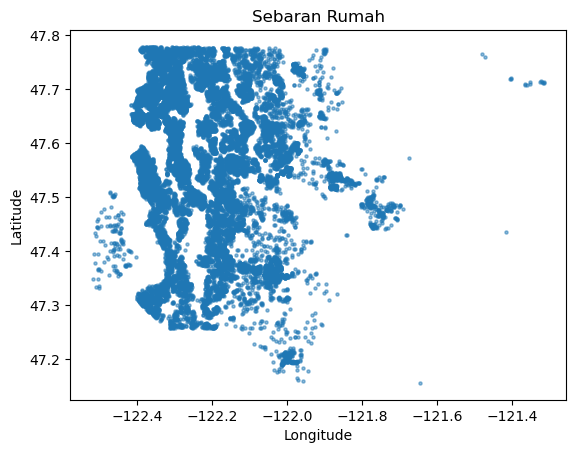

In [22]:
import matplotlib.pyplot as plt

plt.scatter(df['long'], df['lat'], s=5, alpha=0.5)
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.title('Sebaran Rumah')
plt.show()


In [23]:
# --- 1. Hitung IQR ---
Q1 = df[['lat','long']].quantile(0.25)
Q3 = df[['lat','long']].quantile(0.75)
IQR = Q3 - Q1

lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# --- 2. Identifikasi outlier ---
outliers = df[(df['lat'] < lower_bound['lat']) | (df['lat'] > upper_bound['lat']) |
              (df['long'] < lower_bound['long']) | (df['long'] > upper_bound['long'])]

print("Jumlah outlier:", outliers.shape[0])


Jumlah outlier: 257


In [24]:
outliers

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,long,sqft_living15,sqft_lot15,age_since_renovation,is_renovated,Total_rooms,Price_per_sqft,Rooms_per_floor,basement_ratio,LivingLot_ratio
99,437500.0,3,2.50,2320,36847,2.0,0,2,3,9,...,-121.714,2550,35065,22,0,5.50,188.577586,2.750000,0.00000,0.062963
252,415000.0,3,2.25,1510,36224,2.0,0,0,3,8,...,-121.711,1730,36224,24,0,5.25,274.834437,2.625000,0.00000,0.041685
258,255000.0,3,1.00,1230,10170,1.0,0,0,3,7,...,-121.772,1380,10098,35,0,4.00,207.317073,4.000000,0.00000,0.120944
365,465000.0,3,2.00,1840,40438,2.0,0,0,3,7,...,-121.709,1380,44049,21,0,5.00,252.717391,2.500000,0.00000,0.045502
403,437000.0,3,2.50,1750,22357,2.0,0,0,3,8,...,-121.779,2430,22357,21,0,5.50,249.714286,2.750000,0.00000,0.078275
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21344,1488000.0,5,6.00,6880,279968,2.0,0,3,3,12,...,-121.779,4690,256803,7,0,11.00,216.279070,5.500000,0.40843,0.024574
21348,535365.0,4,2.75,2790,6969,2.0,0,0,3,8,...,-121.769,2620,6307,2,0,6.75,191.887097,3.375000,0.00000,0.400344
21382,499990.0,4,2.75,2620,7001,2.0,0,0,3,8,...,-121.769,2620,6543,2,0,6.75,190.835878,3.375000,0.00000,0.374232
21386,320000.0,3,1.75,1790,66250,1.5,0,0,3,7,...,-121.403,1440,59346,12,0,4.75,178.770950,3.166667,0.00000,0.027019


# Lantaran ada outliers aku pakai k medoids

In [25]:
# Kmedoids dnegna metrics euclidean

from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import silhouette_score, davies_bouldin_score
import numpy as np

X = df[['lat','long']].to_numpy()
k_values = range(2, 12)
results_euclidean = {'k': [], 'silhouette': [], 'dbi': []}

dist = distance_metric(type_metric.EUCLIDEAN)

for c in k_values:
    initial_medoids = np.random.choice(len(X), c, replace=False).tolist()
    kmedoids_instance = kmedoids(X, initial_medoids, data_type='points', metric=dist)
    kmedoids_instance.process()
    
    clusters = kmedoids_instance.get_clusters()
    labels = np.zeros(len(X))
    for i, cluster in enumerate(clusters):
        for idx in cluster:
            labels[idx] = i
    
    sil = silhouette_score(X, labels, metric='euclidean')
    db = davies_bouldin_score(X, labels)
    
    results_euclidean['k'].append(c)
    results_euclidean['silhouette'].append(sil)
    results_euclidean['dbi'].append(db)
    
    print(f"[Euclidean] k={c}, Silhouette={sil:.4f}, DBI={db:.4f}")


[Euclidean] k=2, Silhouette=0.3731, DBI=1.0807
[Euclidean] k=3, Silhouette=0.4251, DBI=0.8391
[Euclidean] k=4, Silhouette=0.3802, DBI=0.8603
[Euclidean] k=5, Silhouette=0.3766, DBI=0.8735
[Euclidean] k=6, Silhouette=0.4015, DBI=0.8238
[Euclidean] k=7, Silhouette=0.4159, DBI=0.7319
[Euclidean] k=8, Silhouette=0.4282, DBI=0.7226
[Euclidean] k=9, Silhouette=0.3836, DBI=0.8069
[Euclidean] k=10, Silhouette=0.3793, DBI=0.8215
[Euclidean] k=11, Silhouette=0.4135, DBI=0.7824


In [26]:
## Kmedoids dnegna metrics manhattan


from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
from sklearn.metrics import silhouette_score, davies_bouldin_score
import numpy as np

X = df[['lat','long']].to_numpy()
k_values = range(2, 12)
results_manhattan = {'k': [], 'silhouette': [], 'dbi': []}

# Gunakan Manhattan untuk clustering
dist = distance_metric(type_metric.MANHATTAN)

for c in k_values:
    initial_medoids = np.random.choice(len(X), c, replace=False).tolist()
    kmedoids_instance = kmedoids(X, initial_medoids, data_type='points', metric=dist)
    kmedoids_instance.process()
    
    clusters = kmedoids_instance.get_clusters()
    labels = np.zeros(len(X))
    for i, cluster in enumerate(clusters):
        for idx in cluster:
            labels[idx] = i
    
    # Hitung evaluasi juga pakai Manhattan
    sil = silhouette_score(X, labels, metric='manhattan')
    db = davies_bouldin_score(X, labels)
    
    results_manhattan['k'].append(c)
    results_manhattan['silhouette'].append(sil)
    results_manhattan['dbi'].append(db)
    
    print(f"[Manhattan] k={c}, Silhouette={sil:.4f}, DBI={db:.4f}")


[Manhattan] k=2, Silhouette=0.3713, DBI=1.1576
[Manhattan] k=3, Silhouette=0.4160, DBI=0.8475
[Manhattan] k=4, Silhouette=0.3715, DBI=0.8789
[Manhattan] k=5, Silhouette=0.3591, DBI=0.8721
[Manhattan] k=6, Silhouette=0.3808, DBI=0.8184
[Manhattan] k=7, Silhouette=0.4024, DBI=0.7524
[Manhattan] k=8, Silhouette=0.3892, DBI=0.7893
[Manhattan] k=9, Silhouette=0.4213, DBI=0.7605
[Manhattan] k=10, Silhouette=0.4103, DBI=0.7943
[Manhattan] k=11, Silhouette=0.3920, DBI=0.8479


In [27]:
from pyclustering.cluster.kmedoids import kmedoids
from pyclustering.utils import distance_metric, type_metric
import numpy as np

X = df[['lat','long']].to_numpy()

# Euclidean metric
dist = distance_metric(type_metric.EUCLIDEAN)

# K=9
initial_medoids = np.random.choice(len(X), 9, replace=False).tolist()
kmedoids_instance = kmedoids(X, initial_medoids, data_type='points', metric=dist)
kmedoids_instance.process()

# Ambil hasil cluster
clusters = kmedoids_instance.get_clusters()
medoids = kmedoids_instance.get_medoids()

print("Medoids:", medoids)
print("Clusters:", clusters)


Medoids: [11501, 6996, 1613, 2168, 17053, 14463, 9550, 8517, 16094]
Clusters: [[1, 2, 11, 12, 28, 35, 48, 54, 55, 72, 84, 121, 137, 138, 154, 163, 168, 169, 172, 193, 194, 211, 222, 242, 255, 267, 277, 284, 291, 306, 308, 316, 330, 338, 342, 349, 371, 372, 376, 389, 395, 417, 434, 442, 449, 450, 451, 455, 464, 472, 477, 513, 515, 522, 528, 552, 554, 567, 578, 609, 615, 624, 627, 633, 642, 647, 656, 657, 662, 663, 669, 670, 671, 684, 688, 693, 707, 714, 716, 717, 718, 733, 738, 747, 750, 768, 772, 803, 823, 824, 841, 847, 853, 861, 880, 883, 905, 915, 937, 943, 951, 958, 968, 972, 992, 1003, 1017, 1027, 1049, 1058, 1064, 1071, 1079, 1118, 1130, 1135, 1139, 1140, 1147, 1152, 1161, 1165, 1179, 1185, 1188, 1195, 1198, 1209, 1210, 1214, 1225, 1237, 1252, 1274, 1276, 1300, 1301, 1303, 1309, 1312, 1322, 1327, 1332, 1348, 1355, 1358, 1375, 1379, 1382, 1384, 1391, 1393, 1394, 1417, 1419, 1422, 1424, 1433, 1445, 1450, 1451, 1466, 1468, 1495, 1536, 1540, 1573, 1588, 1589, 1591, 1594, 1605, 1618, 

In [28]:
# Buat array labels untuk tiap titik

labels = np.zeros(len(X), dtype=int)
for cluster_id, cluster_points in enumerate(clusters):
    for point_idx in cluster_points:
        labels[point_idx] = cluster_id

# Tambahkan kolom cluster ke DataFrame asli
df['cluster'] = labels


In [29]:
df

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_living15,sqft_lot15,age_since_renovation,is_renovated,Total_rooms,Price_per_sqft,Rooms_per_floor,basement_ratio,LivingLot_ratio,cluster
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,1340,5650,59,0,4.00,188.050847,4.000000,0.000000,0.208850,5
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,1690,7639,23,1,5.25,209.338521,2.625000,0.155642,0.354874,0
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,2720,8062,82,0,3.00,233.766234,3.000000,0.000000,0.077000,0
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,1360,5000,49,0,7.00,308.163265,7.000000,0.464286,0.392000,4
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,1800,7503,28,0,5.00,303.571429,5.000000,0.000000,0.207921,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,...,1530,1509,5,0,5.50,235.294118,1.833333,0.000000,1.352785,8
21609,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,...,1830,7200,1,0,6.50,173.160173,3.250000,0.000000,0.397385,4
21610,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,...,1020,2007,5,0,2.75,394.216667,1.375000,0.000000,0.755556,5
21611,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,...,1410,1287,11,0,5.50,250.000000,2.750000,0.000000,0.670017,2


In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 25 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   price                 21613 non-null  float64
 1   bedrooms              21613 non-null  int64  
 2   bathrooms             21613 non-null  float64
 3   sqft_living           21613 non-null  int64  
 4   sqft_lot              21613 non-null  int64  
 5   floors                21613 non-null  float64
 6   waterfront            21613 non-null  int64  
 7   view                  21613 non-null  int64  
 8   condition             21613 non-null  int64  
 9   grade                 21613 non-null  int64  
 10  sqft_above            21613 non-null  int64  
 11  sqft_basement         21613 non-null  int64  
 12  lat                   21613 non-null  float64
 13  long                  21613 non-null  float64
 14  sqft_living15         21613 non-null  int64  
 15  sqft_lot15         

# Modelling 

In [30]:
df.columns = df.columns.str.lower()
df

,price,bedrooms,bathrooms,sqft_living,sqft_lot,floors,waterfront,view,condition,grade,...,sqft_living15,sqft_lot15,age_since_renovation,is_renovated,total_rooms,price_per_sqft,rooms_per_floor,basement_ratio,livinglot_ratio,cluster
0,221900.0,3,1.00,1180,5650,1.0,0,0,3,7,...,1340,5650,59,0,4.00,188.050847,4.000000,0.000000,0.208850,5
1,538000.0,3,2.25,2570,7242,2.0,0,0,3,7,...,1690,7639,23,1,5.25,209.338521,2.625000,0.155642,0.354874,0
2,180000.0,2,1.00,770,10000,1.0,0,0,3,6,...,2720,8062,82,0,3.00,233.766234,3.000000,0.000000,0.077000,0
3,604000.0,4,3.00,1960,5000,1.0,0,0,5,7,...,1360,5000,49,0,7.00,308.163265,7.000000,0.464286,0.392000,4
4,510000.0,3,2.00,1680,8080,1.0,0,0,3,8,...,1800,7503,28,0,5.00,303.571429,5.000000,0.000000,0.207921,2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
21608,360000.0,3,2.50,1530,1131,3.0,0,0,3,8,...,1530,1509,5,0,5.50,235.294118,1.833333,0.000000,1.352785,8
21609,400000.0,4,2.50,2310,5813,2.0,0,0,3,8,...,1830,7200,1,0,6.50,173.160173,3.250000,0.000000,0.397385,4
21610,402101.0,2,0.75,1020,1350,2.0,0,0,3,7,...,1020,2007,5,0,2.75,394.216667,1.375000,0.000000,0.755556,5
21611,400000.0,3,2.50,1600,2388,2.0,0,0,3,8,...,1410,1287,11,0,5.50,250.000000,2.750000,0.000000,0.670017,2


In [31]:
#Pisahkan X dan y
X= df.drop(columns=['price', 'lat','long',])
y= df['price']

In [32]:
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

In [33]:
categorical_columns= ['waterfront', 'view', 'condition', 'grade', 'is_renovated','cluster']

# Mendapatkan kolom numerik dengan menghilangkan kolom kategorikal dari daftar kolom
numerical_columns = [col for col in X.columns if col not in categorical_columns]

In [34]:
# Memisahkan DataFrame menjadi kolom kategorikal dan numerik
X_train_categorical = X_train[categorical_columns]
X_train_numerical = X_train[numerical_columns]

In [35]:
X_train_categorical

,waterfront,view,condition,grade,is_renovated,cluster
6325,0,0,4,9,0,1
13473,0,0,3,6,0,5
17614,0,0,3,6,0,4
16970,0,0,4,7,0,3
20868,0,0,3,8,0,6
...,...,...,...,...,...,...
11964,0,0,3,7,0,0
21575,0,0,3,8,0,7
5390,0,0,3,7,0,2
860,0,0,3,5,0,4


In [36]:
X_train_categorical.nunique()

waterfront       2
view             5
condition        5
grade           12
is_renovated     2
cluster          9
dtype: int64

In [37]:
X_train_numerical

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,sqft_living15,sqft_lot15,age_since_renovation,total_rooms,price_per_sqft,rooms_per_floor,basement_ratio,livinglot_ratio
6325,3,1.75,1780,13095,1.0,1780,0,2750,13095,31,4.75,182.584270,4.750000,0.000000,0.135930
13473,2,1.00,1000,3700,1.0,800,200,1270,5000,86,3.00,257.000000,3.000000,0.200000,0.270270
17614,3,1.00,1080,7486,1.5,990,90,1170,7800,73,4.00,211.574074,2.666667,0.083333,0.144269
16970,3,2.25,2090,7500,1.0,1280,810,1800,7350,38,5.25,137.799043,5.250000,0.387560,0.278667
20868,2,2.50,1741,1439,2.0,1446,295,2090,10454,8,4.50,275.129236,2.250000,0.169443,1.209868
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11964,3,1.50,1000,6914,1.0,1000,0,1000,6947,67,4.50,378.000000,4.500000,0.000000,0.144634
21575,3,2.50,3087,5002,2.0,3087,0,2927,5183,0,5.50,129.559443,2.750000,0.000000,0.617153
5390,3,2.50,2120,4780,2.0,2120,0,1690,2650,10,5.50,271.226415,2.750000,0.000000,0.443515
860,1,0.75,380,15000,1.0,380,0,1170,15000,51,1.75,644.736842,1.750000,0.000000,0.025333


In [38]:
X_train_numerical.info()

<class 'pandas.core.frame.DataFrame'>
Index: 17290 entries, 6325 to 15795
Data columns (total 15 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   bedrooms              17290 non-null  int64  
 1   bathrooms             17290 non-null  float64
 2   sqft_living           17290 non-null  int64  
 3   sqft_lot              17290 non-null  int64  
 4   floors                17290 non-null  float64
 5   sqft_above            17290 non-null  int64  
 6   sqft_basement         17290 non-null  int64  
 7   sqft_living15         17290 non-null  int64  
 8   sqft_lot15            17290 non-null  int64  
 9   age_since_renovation  17290 non-null  int64  
 10  total_rooms           17290 non-null  float64
 11  price_per_sqft        17290 non-null  float64
 12  rooms_per_floor       17290 non-null  float64
 13  basement_ratio        17290 non-null  float64
 14  livinglot_ratio       17290 non-null  float64
dtypes: float64(7), int64(

In [39]:
X_train_numerical.isnull().sum()

bedrooms                0
bathrooms               0
sqft_living             0
sqft_lot                0
floors                  0
sqft_above              0
sqft_basement           0
sqft_living15           0
sqft_lot15              0
age_since_renovation    0
total_rooms             0
price_per_sqft          0
rooms_per_floor         0
basement_ratio          0
livinglot_ratio         0
dtype: int64

In [40]:
def cek_outlier(data):
    """
    Mengecek jumlah dan persentase outlier di setiap kolom numerik.
    """
    numeric_cols = data.select_dtypes(include=['number']).columns
    
    for col in numeric_cols:
        Q1 = data[col].quantile(0.25)
        Q3 = data[col].quantile(0.75)
        IQR = Q3 - Q1

        lower = Q1 - 1.5 * IQR
        upper = Q3 + 1.5 * IQR

        outlier_count = ((data[col] < lower) | (data[col] > upper)).sum()
        total = len(data[col])
        percentage = outlier_count / total * 100

        print(f"{col}: {outlier_count} outliers ({percentage:.2f}%)")


In [41]:
cek_outlier(X_train_numerical)

bedrooms: 419 outliers (2.42%)
bathrooms: 209 outliers (1.21%)
sqft_living: 459 outliers (2.65%)
sqft_lot: 1917 outliers (11.09%)
floors: 0 outliers (0.00%)
sqft_above: 505 outliers (2.92%)
sqft_basement: 448 outliers (2.59%)
sqft_living15: 401 outliers (2.32%)
sqft_lot15: 1721 outliers (9.95%)
age_since_renovation: 0 outliers (0.00%)
total_rooms: 129 outliers (0.75%)
price_per_sqft: 551 outliers (3.19%)
rooms_per_floor: 430 outliers (2.49%)
basement_ratio: 0 outliers (0.00%)
livinglot_ratio: 1094 outliers (6.33%)


In [42]:
# Mengecek skewness semua kolom numerik
skew_values = X_train_numerical.skew()
print(skew_values)

bedrooms                 2.304038
bathrooms                0.464500
sqft_living              1.370978
sqft_lot                11.589007
floors                   0.615275
sqft_above               1.427666
sqft_basement            1.570704
sqft_living15            1.095409
sqft_lot15               9.701509
age_since_renovation     0.557651
total_rooms              0.798418
price_per_sqft           1.242116
rooms_per_floor          1.399525
basement_ratio           0.926617
livinglot_ratio          2.404249
dtype: float64


In [43]:
X_train_numerical= X_train_numerical.copy()

#Daftar kolom yang akan di log transform
cols_log = [
    'bedrooms',
    'sqft_lot',
    'sqft_above',
    'sqft_basement',
    'sqft_living15',
    'sqft_lot15',
    'price_per_sqft',
    'rooms_per_floor',
    'basement_ratio',
    'livinglot_ratio'
]

#Transformasi pada X_train_numeric
X_train_numerical[cols_log] = X_train_numerical[cols_log].apply(lambda x: np.log1p(x))
X_train_numerical

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,sqft_living15,sqft_lot15,age_since_renovation,total_rooms,price_per_sqft,rooms_per_floor,basement_ratio,livinglot_ratio
6325,1.386294,1.75,1780,9.480062,1.0,7.484930,0.000000,7.919720,9.480062,31,4.75,5.212674,1.749200,0.000000,0.127451
13473,1.098612,1.00,1000,8.216358,1.0,6.685861,5.303305,7.147559,8.517393,86,3.00,5.552960,1.386294,0.182322,0.239230
17614,1.386294,1.00,1080,8.920923,1.5,6.898715,4.510860,7.065613,8.962007,73,4.00,5.359291,1.299283,0.080043,0.134766
16970,1.386294,2.25,2090,8.922792,1.0,7.155396,6.698268,7.496097,8.902592,38,5.25,4.933027,1.832581,0.327547,0.245818
20868,1.098612,2.50,1741,7.272398,2.0,7.277248,5.690359,7.645398,9.254836,8,4.50,5.620869,1.178655,0.156527,0.792933
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
11964,1.386294,1.50,1000,8.841448,1.0,6.908755,0.000000,6.908755,8.846209,67,4.50,5.937536,1.704748,0.000000,0.135085
21575,1.386294,2.50,3087,8.517793,2.0,8.035279,0.000000,7.982075,8.553332,0,5.50,4.871829,1.321756,0.000000,0.480667
5390,1.386294,2.50,2120,8.472405,2.0,7.659643,0.000000,7.433075,7.882692,10,5.50,5.606634,1.321756,0.000000,0.367081
860,0.693147,0.75,380,9.615872,1.0,5.942799,0.000000,7.065613,9.615872,51,1.75,6.470392,1.011601,0.000000,0.025018


In [44]:
# Mengecek skewness semua kolom numerik
skew_values = X_train_numerical.skew()
print(skew_values)

bedrooms               -0.425831
bathrooms               0.464500
sqft_living             1.370978
sqft_lot                0.931184
floors                  0.615275
sqft_above              0.245966
sqft_basement           0.497447
sqft_living15           0.193190
sqft_lot15              0.976626
age_since_renovation    0.557651
total_rooms             0.798418
price_per_sqft          0.141412
rooms_per_floor         0.094946
basement_ratio          0.843446
livinglot_ratio         1.434661
dtype: float64


In [45]:
cek_outlier(X_train_numerical)

bedrooms: 419 outliers (2.42%)
bathrooms: 209 outliers (1.21%)
sqft_living: 459 outliers (2.65%)
sqft_lot: 2057 outliers (11.90%)
floors: 0 outliers (0.00%)
sqft_above: 44 outliers (0.25%)
sqft_basement: 0 outliers (0.00%)
sqft_living15: 51 outliers (0.29%)
sqft_lot15: 1992 outliers (11.52%)
age_since_renovation: 0 outliers (0.00%)
total_rooms: 129 outliers (0.75%)
price_per_sqft: 41 outliers (0.24%)
rooms_per_floor: 111 outliers (0.64%)
basement_ratio: 0 outliers (0.00%)
livinglot_ratio: 857 outliers (4.96%)


In [47]:
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import StandardScaler, RobustScaler
import pandas as pd

robust_features = ['sqft_lot', 'sqft_lot15', 'livinglot_ratio']
standard_features = ['bedrooms', 'bathrooms', 'sqft_living', 'floors','sqft_above','sqft_basement', 
                     'sqft_living15','age_since_renovation', 'total_rooms', 
                     'price_per_sqft','rooms_per_floor','basement_ratio']

preprocessor = ColumnTransformer(
    transformers=[
        ('robust', RobustScaler(), robust_features),
        ('standard', StandardScaler(), standard_features)
    ]
)

# Fit & transform
X_train_numeric_scaled = pd.DataFrame(
    preprocessor.fit_transform(X_train_numerical),
    columns=robust_features + standard_features,
    index=X_train_numerical.index
)

X_train_numeric_scaled.head()


,sqft_lot,sqft_lot15,livinglot_ratio,bedrooms,bathrooms,sqft_living,floors,sqft_above,sqft_basement,sqft_living15,age_since_renovation,total_rooms,price_per_sqft,rooms_per_floor,basement_ratio
6325,0.723732,0.795765,-0.473751,-0.310253,-0.474451,-0.323933,-0.919600,0.211065,-0.792710,1.167225,-0.341254,-0.494443,-0.734054,0.653191,-0.736524
13473,-0.957403,-0.617481,0.087906,-1.663808,-1.452583,-1.183653,-0.919600,-1.667100,0.883345,-1.196846,1.563694,-1.676632,0.131292,-0.659458,0.535661
17614,-0.020103,0.035234,-0.436996,-0.310253,-1.452583,-1.095477,0.001545,-1.166801,0.632901,-1.447734,1.113433,-1.001095,-0.361208,-0.974183,-0.178010
16970,-0.017618,-0.051991,0.121010,-0.310253,0.177636,0.017751,-0.919600,-0.563485,1.324209,-0.129751,-0.098806,-0.156675,-1.445195,0.954787,1.548999
20868,-2.213174,0.465121,2.870122,-1.663808,0.503680,-0.366919,0.922690,-0.277080,1.005669,0.327352,-1.137868,-0.663327,0.303985,-1.410501,0.355677


In [48]:
#X_train_categorical
X_train_categorical

,waterfront,view,condition,grade,is_renovated,cluster
6325,0,0,4,9,0,1
13473,0,0,3,6,0,5
17614,0,0,3,6,0,4
16970,0,0,4,7,0,3
20868,0,0,3,8,0,6
...,...,...,...,...,...,...
11964,0,0,3,7,0,0
21575,0,0,3,8,0,7
5390,0,0,3,7,0,2
860,0,0,3,5,0,4


In [49]:
from sklearn.preprocessing import OneHotEncoder
import pandas as pd

X_train_categorical = X_train_categorical.copy()

# pakai sparse_output, bukan sparse
encoder = OneHotEncoder(sparse_output=False, drop=None)
cluster_encoded = encoder.fit_transform(X_train_categorical[['cluster']])

# ubah hasil OHE jadi dataframe
cluster_encoded_df = pd.DataFrame(
    cluster_encoded, 
    columns=[f"cluster_{int(i)}" for i in range(cluster_encoded.shape[1])],
    index=X_train_categorical.index
)

# timpa X_train_categorical dengan versi OHE
X_train_categorical = pd.concat(
    [X_train_categorical.drop('cluster', axis=1), cluster_encoded_df], 
    axis=1
)

X_train_categorical.head()

,waterfront,view,condition,grade,is_renovated,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8
6325,0,0,4,9,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
13473,0,0,3,6,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
17614,0,0,3,6,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
16970,0,0,4,7,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
20868,0,0,3,8,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [50]:
X_train_concat = pd.concat([X_train_numeric_scaled.reset_index(drop=True),
                           X_train_categorical.reset_index(drop=True)], axis=1)
X_train_concat

,sqft_lot,sqft_lot15,livinglot_ratio,bedrooms,bathrooms,sqft_living,floors,sqft_above,sqft_basement,sqft_living15,...,is_renovated,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8
0,0.723732,0.795765,-0.473751,-0.310253,-0.474451,-0.323933,-0.919600,0.211065,-0.792710,1.167225,...,0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,-0.957403,-0.617481,0.087906,-1.663808,-1.452583,-1.183653,-0.919600,-1.667100,0.883345,-1.196846,...,0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0
2,-0.020103,0.035234,-0.436996,-0.310253,-1.452583,-1.095477,0.001545,-1.166801,0.632901,-1.447734,...,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0
3,-0.017618,-0.051991,0.121010,-0.310253,0.177636,0.017751,-0.919600,-0.563485,1.324209,-0.129751,...,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
4,-2.213174,0.465121,2.870122,-1.663808,0.503680,-0.366919,0.922690,-0.277080,1.005669,0.327352,...,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
17285,-0.125831,-0.134763,-0.435395,-0.310253,-0.800495,-1.183653,-0.919600,-1.143202,-0.792710,-1.927978,...,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
17286,-0.556397,-0.564721,1.301068,-0.310253,0.503680,1.116650,0.922690,1.504627,-0.792710,1.358134,...,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
17287,-0.616778,-1.549254,0.730325,-0.310253,0.503680,0.050817,0.922690,0.621717,-0.792710,-0.322701,...,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
17288,0.904403,0.995141,-0.988454,-3.571537,-1.778627,-1.867021,-0.919600,-3.413623,-0.792710,-1.447734,...,0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0


In [51]:
#X_test_

X_test_categorical = X_test[categorical_columns]
X_test_numerical = X_test[numerical_columns]

In [52]:
X_test_categorical

,waterfront,view,condition,grade,is_renovated,cluster
735,0,0,4,8,0,3
2830,0,0,5,8,0,0
4106,0,2,3,11,0,3
16218,0,2,3,12,0,0
19964,0,0,3,9,0,6
...,...,...,...,...,...,...
13674,0,0,4,7,0,0
20377,0,0,3,8,0,2
8805,0,0,3,8,0,7
10168,0,0,4,8,0,6


In [53]:
X_test_numerical

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,sqft_living15,sqft_lot15,age_since_renovation,total_rooms,price_per_sqft,rooms_per_floor,basement_ratio,livinglot_ratio
735,4,2.25,2070,8893,2.0,2070,0,2390,7700,28,6.25,176.328502,3.125,0.000000,0.232767
2830,5,3.00,2900,6730,1.0,1830,1070,2370,6283,37,8.00,298.275862,8.000,0.368966,0.430906
4106,4,2.50,3770,10893,2.0,3770,0,3710,9685,17,6.50,275.331565,3.250,0.000000,0.346094
16218,3,3.50,4560,14608,2.0,4560,0,4050,14226,25,6.50,326.754386,3.250,0.000000,0.312158
19964,3,2.50,2550,5376,2.0,2550,0,2250,4050,10,5.50,278.823529,2.750,0.000000,0.474330
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13674,3,1.75,1250,7710,1.0,1250,0,1340,7710,67,4.75,270.400000,4.750,0.000000,0.162127
20377,3,2.75,2830,3496,2.0,2830,0,2160,3501,2,5.75,237.809187,2.875,0.000000,0.809497
8805,4,2.50,2434,4400,2.0,2434,0,2434,4400,7,6.50,117.091208,3.250,0.000000,0.553182
10168,4,1.75,2250,10108,1.0,2250,0,2050,9750,47,5.75,268.888889,5.750,0.000000,0.222596


In [54]:
X_test_numerical= X_test_numerical.copy()

#Daftar kolom yang akan di log transform
cols_log = [
    'bedrooms',
    'sqft_lot',
    'sqft_above',
    'sqft_basement',
    'sqft_living15',
    'sqft_lot15',
    'price_per_sqft',
    'rooms_per_floor',
    'basement_ratio',
    'livinglot_ratio'
]

#Transformasi pada X_train_numeric
X_test_numerical[cols_log] = X_test_numerical[cols_log].apply(lambda x: np.log1p(x))
X_test_numerical

,bedrooms,bathrooms,sqft_living,sqft_lot,floors,sqft_above,sqft_basement,sqft_living15,sqft_lot15,age_since_renovation,total_rooms,price_per_sqft,rooms_per_floor,basement_ratio,livinglot_ratio
735,1.609438,2.25,2070,9.093132,2.0,7.635787,0.000000,7.779467,8.949105,28,6.25,5.178004,1.417066,0.000000,0.209262
2830,1.791759,3.00,2900,8.814479,1.0,7.512618,6.976348,7.771067,8.745762,37,8.00,5.701366,2.197225,0.314055,0.358308
4106,1.609438,2.50,3770,9.295967,2.0,8.235095,0.000000,8.219057,9.178437,17,6.50,5.621601,1.446919,0.000000,0.297207
16218,1.386294,3.50,4560,9.589393,2.0,8.425297,0.000000,8.306719,9.562897,25,6.50,5.792265,1.446919,0.000000,0.271673
19964,1.386294,2.50,2550,8.589886,2.0,7.844241,0.000000,7.719130,8.306719,10,5.50,5.634159,1.321756,0.000000,0.388204
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13674,1.386294,1.75,1250,8.950403,1.0,7.131699,0.000000,7.201171,8.950403,67,4.75,5.603594,1.749200,0.000000,0.150252
20377,1.386294,2.75,2830,8.159661,2.0,7.948385,0.000000,7.678326,8.161090,2,5.75,5.475665,1.354546,0.000000,0.593049
8805,1.609438,2.50,2434,8.389587,2.0,7.797702,0.000000,7.797702,8.389587,7,6.50,4.771457,1.446919,0.000000,0.440306
10168,1.609438,1.75,2250,9.221181,1.0,7.719130,0.000000,7.626083,9.185125,47,5.75,5.598010,1.909543,0.000000,0.200976


In [55]:
X_test_numerical_scaled = pd.DataFrame(
    preprocessor.transform(X_test_numerical),
    columns=robust_features + standard_features,
    index=X_test.index
)

In [56]:
X_test_numerical_scaled.head()

,sqft_lot,sqft_lot15,livinglot_ratio,bedrooms,bathrooms,sqft_living,floors,sqft_above,sqft_basement,sqft_living15,age_since_renovation,total_rooms,price_per_sqft,rooms_per_floor,basement_ratio
735,0.208990,0.016294,-0.062677,0.739645,0.177636,-0.004293,0.92269,0.565645,-0.792710,0.737823,-0.445160,0.518862,-0.822219,-0.548155,-0.736524
2830,-0.161709,-0.282225,0.686244,1.597475,1.155768,0.910538,-0.91960,0.276142,1.412093,0.712105,-0.133441,1.701051,0.508688,2.273721,1.454860
4106,0.478826,0.352964,0.379227,0.739645,0.503680,1.869457,0.92269,1.974284,-0.792710,2.083685,-0.826150,0.687746,0.305848,-0.440176,-0.736524
16218,0.869177,0.917370,0.250925,-0.310253,1.807856,2.740199,0.92269,2.421342,-0.792710,2.352075,-0.549066,0.687746,0.739843,-0.440176,-0.736524
19964,-0.460490,-0.926762,0.836463,-0.310253,0.503680,0.524766,0.92269,1.055603,-0.792710,0.553093,-1.068598,0.012210,0.337782,-0.892898,-0.736524


In [57]:
# transform X_test pakai encoder yang sudah di-fit dari X_train
cluster_encoded_test = encoder.transform(X_test_categorical[['cluster']])

# ubah hasil OHE jadi dataframe
cluster_encoded_test_df = pd.DataFrame(
    cluster_encoded_test,
    columns=[f"cluster_{int(i)}" for i in range(cluster_encoded_test.shape[1])],
    index=X_test_categorical.index
)

# gabungkan dengan X_test (kecuali kolom cluster lama)
X_test_categorical = pd.concat(
    [X_test_categorical.drop('cluster', axis=1), cluster_encoded_test_df],
    axis=1
)

X_test_categorical


,waterfront,view,condition,grade,is_renovated,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8
735,0,0,4,8,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
2830,0,0,5,8,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4106,0,2,3,11,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
16218,0,2,3,12,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
19964,0,0,3,9,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13674,0,0,4,7,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
20377,0,0,3,8,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
8805,0,0,3,8,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
10168,0,0,4,8,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [58]:
X_test_concat = pd.concat([X_test_numerical_scaled.reset_index(drop=True),
                          X_test_categorical.reset_index(drop=True)], axis=1)

In [59]:
X_test_concat

,sqft_lot,sqft_lot15,livinglot_ratio,bedrooms,bathrooms,sqft_living,floors,sqft_above,sqft_basement,sqft_living15,...,is_renovated,cluster_0,cluster_1,cluster_2,cluster_3,cluster_4,cluster_5,cluster_6,cluster_7,cluster_8
0,0.208990,0.016294,-0.062677,0.739645,0.177636,-0.004293,0.92269,0.565645,-0.792710,0.737823,...,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
1,-0.161709,-0.282225,0.686244,1.597475,1.155768,0.910538,-0.91960,0.276142,1.412093,0.712105,...,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.478826,0.352964,0.379227,0.739645,0.503680,1.869457,0.92269,1.974284,-0.792710,2.083685,...,0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0
3,0.869177,0.917370,0.250925,-0.310253,1.807856,2.740199,0.92269,2.421342,-0.792710,2.352075,...,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,-0.460490,-0.926762,0.836463,-0.310253,0.503680,0.524766,0.92269,1.055603,-0.792710,0.553093,...,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4318,0.019114,0.018199,-0.359184,-0.310253,-0.474451,-0.908102,-0.91960,-0.619185,-0.792710,-1.032707,...,0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4319,-1.032829,-1.140553,1.865756,-0.310253,0.829724,0.833383,0.92269,1.300389,-0.792710,0.428167,...,0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0
4320,-0.726952,-0.805107,1.098261,0.739645,0.503680,0.396910,0.92269,0.946217,-0.792710,0.793652,...,0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
4321,0.379337,0.362782,-0.104307,0.739645,-0.474451,0.194104,-0.91960,0.761538,-0.792710,0.268217,...,0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0


In [60]:
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score, mean_absolute_percentage_error

# ===== Baseline Train =====
baseline_pred_train_mean = np.mean(y_train)
baseline_train_pred = np.ones(len(y_train)) * baseline_pred_train_mean

baseline_train_mae = mean_absolute_error(y_train, baseline_train_pred)
baseline_train_mape = mean_absolute_percentage_error(y_train, baseline_train_pred)
baseline_train_mse = mean_squared_error(y_train, baseline_train_pred)
baseline_train_rmse = np.sqrt(baseline_train_mse)
baseline_train_r2 = r2_score(y_train, baseline_train_pred)

# ===== Baseline Test =====
baseline_pred_test_mean = np.mean(y_test)
baseline_test_pred = np.ones(len(y_test)) * baseline_pred_test_mean

baseline_test_mae = mean_absolute_error(y_test, baseline_test_pred)
baseline_test_mape = mean_absolute_percentage_error(y_test, baseline_test_pred)
baseline_test_mse = mean_squared_error(y_test, baseline_test_pred)
baseline_test_rmse = np.sqrt(baseline_test_mse)
baseline_test_r2 = r2_score(y_test, baseline_test_pred)

# ===== Tampilkan Hasil =====
print("=== Baseline Train Evaluasi ===")
print('MAE :', baseline_train_mae)
print('MAPE:', baseline_train_mape)
print('MSE:', baseline_train_mse)
print('RMSE:', baseline_train_rmse)
print('R2:', baseline_train_r2)

print("\n=== Baseline Test Evaluasi ===")
print('MAE :', baseline_test_mae)
print('MAPE:', baseline_test_mape)
print('MSE:', baseline_test_mse)
print('RMSE:', baseline_test_rmse)
print('R2:', baseline_test_r2)

=== Baseline Train Evaluasi ===
MAE : 231680.07680702177
MAPE: 0.5328702778724583
MSE: 130648613752.34962
RMSE: 361453.473841862
R2: 0.0

=== Baseline Test Evaluasi ===
MAE : 242951.54069922463
MAPE: 0.5465247461749916
MSE: 151176712256.85657
RMSE: 388814.4959448613
R2: 0.0


In [ ]:
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor


from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from math import sqrt
import numpy as np

# Fungsi evaluasi model (default param)
def evaluate_model(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    metrics = {
        "MAE Train": mean_absolute_error(y_train, y_train_pred),
        "MAPE Train": np.mean(np.abs((y_train - y_train_pred) / y_train)) * 100,
        "MSE Train": mean_squared_error(y_train, y_train_pred),
        "RMSE Train": sqrt(mean_squared_error(y_train, y_train_pred)),
        "R2 Train": r2_score(y_train, y_train_pred),

        "MAE Test": mean_absolute_error(y_test, y_test_pred),
        "MAPE Test": np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100,
        "MSE Test": mean_squared_error(y_test, y_test_pred),
        "RMSE Test": sqrt(mean_squared_error(y_test, y_test_pred)),
        "R2 Test": r2_score(y_test, y_test_pred)
    }
    return metrics

# Kumpulan model dengan parameter default
models = {
    "Linear Regression": LinearRegression(),
    "KNN": KNeighborsRegressor(),
    "Decision Tree": DecisionTreeRegressor(),
    "Random Forest": RandomForestRegressor(),
}

# Loop
results = {}
for name, model in models.items():
    results[name] = evaluate_model(model, X_train_concat, y_train, X_test_concat, y_test)

# Print hasil
for name, metrics in results.items():
    print(f"\n=== {name} ===")
    for metric_name, value in metrics.items():
        print(f"{metric_name}: {value:.4f}")


c:\Users\ASUS\anaconda3\envs\boosting_and_clustering\Lib\site-packages\threadpoolctl.py:1226: RuntimeWarning: 
Found Intel OpenMP ('libiomp') and LLVM OpenMP ('libomp') loaded at
the same time. Both libraries are known to be incompatible and this
can cause random crashes or deadlocks on Linux when loaded in the
same Python program.
Using threadpoolctl may cause crashes or deadlocks. For more
information and possible workarounds, please see
    https://github.com/joblib/threadpoolctl/blob/master/multiple_openmp.md

  warnings.warn(msg, RuntimeWarning)



=== Linear Regression ===
MAE Train: 67858.5964
MAPE Train: 16.3327
MSE Train: 15142427013.8800
RMSE Train: 123054.5693
R2 Train: 0.8841
MAE Test: 72641.2645
MAPE Test: 16.4387
MSE Test: 19330650674.4104
RMSE Test: 139034.7103
R2 Test: 0.8721

=== KNN ===
MAE Train: 50866.8268
MAPE Train: 9.1051
MSE Train: 8712052614.4711
RMSE Train: 93338.3770
R2 Train: 0.9333
MAE Test: 67381.0531
MAPE Test: 11.3673
MSE Test: 19370925308.2586
RMSE Test: 139179.4716
R2 Test: 0.8719

=== Decision Tree ===
MAE Train: 0.0000
MAPE Train: 0.0000
MSE Train: 0.0000
RMSE Train: 0.0000
R2 Train: 1.0000
MAE Test: 14296.5115
MAPE Test: 1.8902
MSE Test: 2982772119.7277
RMSE Test: 54614.7610
R2 Test: 0.9803

=== Random Forest ===
MAE Train: 2012.8445
MAPE Train: 0.2832
MSE Train: 143100224.5082
RMSE Train: 11962.4506
R2 Train: 0.9989
MAE Test: 5410.2484
MAPE Test: 0.6995
MSE Test: 852171205.0962
RMSE Test: 29191.9716
R2 Test: 0.9944


In [62]:
X_train_concat.shape

(17290, 29)

In [63]:
# Random Forest ini udah paling bagus tinggal di tuning aja

In [64]:
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from math import sqrt
import numpy as np
from itertools import product
import pandas as pd

# Rule of thumb range
n_estimators = [240]                         # 10 * p
max_features_range = [4, 5, 8]                # sqrt(p), log2(p), p/3
min_samples_leaf_range = [1, 5, 10, 50, 100, 173]  # 1 sampai 0.01*n
max_depth_range = [7, 10, 14, None]          # log2(n)/2 sampai log2(n)

results_rf = []

# Loop semua kombinasi
for min_samples_leaf, max_depth, max_features in product(min_samples_leaf_range, max_depth_range, max_features_range):
    rf = RandomForestRegressor(
        n_estimators=n_estimators[0],
        max_features=max_features,        
        min_samples_leaf=min_samples_leaf,
        max_depth=max_depth,
        random_state=42,
        n_jobs=-1
    )
    
    # Train
    rf.fit(X_train_concat, y_train)
    
    # Predict
    y_train_pred = rf.predict(X_train_concat)
    y_test_pred = rf.predict(X_test_concat)
    
    # Metrics
    mse_train = mean_squared_error(y_train, y_train_pred)
    rmse_train = sqrt(mse_train)
    mae_train = mean_absolute_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)

    mse_test = mean_squared_error(y_test, y_test_pred)
    rmse_test = sqrt(mse_test)
    mae_test = mean_absolute_error(y_test, y_test_pred)
    r2_test = r2_score(y_test, y_test_pred)

    mape_train = np.mean(np.abs((y_train - y_train_pred) / y_train)) * 100
    mape_test = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
    
    results_rf.append({
        'n_estimators': n_estimators[0],
        'max_features': max_features,
        'min_samples_leaf': min_samples_leaf,
        'max_depth': max_depth,
        'MAE_train': mae_train,
        'MAE_test': mae_test,
        'MAPE_train': mape_train,
        'MAPE_test': mape_test,
        'MSE_train': mse_train,
        'MSE_test': mse_test,
        'RMSE_train': rmse_train,
        'RMSE_test': rmse_test,
        'R2_train': r2_train,
        'R2_test': r2_test,
        'R2_selisih': r2_train - r2_test
    })


In [65]:

results_df = pd.DataFrame(results_rf)
results_df = results_df.sort_values(by="R2_test", ascending=False)
results_df


,n_estimators,max_features,min_samples_leaf,max_depth,MAE_train,MAE_test,MAPE_train,MAPE_test,MSE_train,MSE_test,RMSE_train,RMSE_test,R2_train,R2_test,R2_selisih
8,240,8,1,14.0,12962.212896,24592.063502,2.647769,4.314477,6.024035e+08,3.896614e+09,24543.909186,62422.862084,0.995389,0.974225,0.021164
11,240,8,1,NaN,7563.829389,21767.730280,1.327927,3.584554,4.538812e+08,4.062604e+09,21304.486731,63738.559145,0.996526,0.973127,0.023399
23,240,8,5,NaN,16529.229239,25669.508097,2.945758,4.324032,2.781694e+09,4.745272e+09,52741.766578,68885.935464,0.978709,0.968611,0.010097
5,240,8,1,10.0,27787.327176,35324.363024,6.058315,6.945818,1.858518e+09,4.813865e+09,43110.535777,69382.021306,0.985775,0.968157,0.017617
20,240,8,5,14.0,18632.302429,27499.751888,3.485265,4.744861,2.860146e+09,5.069572e+09,53480.329085,71200.929752,0.978108,0.966466,0.011642
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
64,240,5,173,10.0,81476.808272,88232.174221,15.636812,15.918041,3.244571e+10,4.169368e+10,180126.924450,204190.306123,0.751657,0.724206,0.027451
63,240,4,173,10.0,89278.911173,95856.847863,17.444674,17.656828,3.529682e+10,4.480401e+10,187874.468162,211669.578617,0.729834,0.703632,0.026202
60,240,4,173,7.0,93147.220756,99568.731575,18.818832,18.942418,3.608056e+10,4.568265e+10,189948.828502,213735.005464,0.723835,0.697820,0.026016
66,240,4,173,14.0,89909.773379,96594.602582,17.455014,17.686065,3.604722e+10,4.571235e+10,189861.062716,213804.462896,0.724090,0.697623,0.026467


In [66]:
from xgboost import XGBRegressor
from catboost import CatBoostRegressor
from lightgbm import LGBMRegressor

from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from math import sqrt
import numpy as np

# --- Fungsi evaluasi model ---
def evaluate_model(model, X_train, y_train, X_test, y_test):
    model.fit(X_train, y_train)
    y_train_pred = model.predict(X_train)
    y_test_pred = model.predict(X_test)

    r2_train = r2_score(y_train, y_train_pred)
    r2_test = r2_score(y_test, y_test_pred)

    metrics = {
        "MAE Train": mean_absolute_error(y_train, y_train_pred),
        "MAPE Train": np.mean(np.abs((y_train - y_train_pred) / y_train)) * 100,
        "MSE Train": mean_squared_error(y_train, y_train_pred),
        "RMSE Train": sqrt(mean_squared_error(y_train, y_train_pred)),
        "R2 Train": r2_train,

        "MAE Test": mean_absolute_error(y_test, y_test_pred),
        "MAPE Test": np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100,
        "MSE Test": mean_squared_error(y_test, y_test_pred),
        "RMSE Test": sqrt(mean_squared_error(y_test, y_test_pred)),
        "R2 Test": r2_test,

        "R2 Selisih (Train - Test)": r2_train - r2_test
    }
    return metrics

# --- Kumpulan model boosting ---
models = {
    "XGBoost": XGBRegressor(verbosity=0),
    "CatBoost": CatBoostRegressor(verbose=0),
    "LightGBM": LGBMRegressor()
}

# --- Loop evaluasi ---
results = {}
for name, model in models.items():
    results[name] = evaluate_model(model, X_train_concat, y_train, X_test_concat, y_test)


# --- Print hasil ---
for name, metrics in results.items():
    print(f"\n=== {name} ===")
    for metric_name, value in metrics.items():
        print(f"{metric_name}: {value:.4f}")


[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000656 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 2631
[LightGBM] [Info] Number of data points in the train set: 17290, number of used features: 29
[LightGBM] [Info] Start training from score 537768.047947

=== XGBoost ===
MAE Train: 5820.6966
MAPE Train: 1.2184
MSE Train: 63683139.8922
RMSE Train: 7980.1717
R2 Train: 0.9995
MAE Test: 10827.9772
MAPE Test: 1.6693
MSE Test: 1336836314.0827
RMSE Test: 36562.7722
R2 Test: 0.9912
R2 Selisih (Train - Test): 0.0084

=== CatBoost ===
MAE Train: 4054.6145
MAPE Train: 0.8218
MSE Train: 34297612.6605
RMSE Train: 5856.4164
R2 Train: 0.9997
MAE Test: 6122.7730
MAPE Test: 0.9699
MSE Test: 465820131.9495
RMSE Test: 21582.8666
R2 Test: 0.9969
R2 Selisih (Train - Test): 0.0028

=== LightGBM ===
MAE Train: 7569.5068
MAPE Train: 1.3556
MSE Train: 82342

In [67]:
#Kalau algrotima boosting yg perlu dituning yakni light gbm

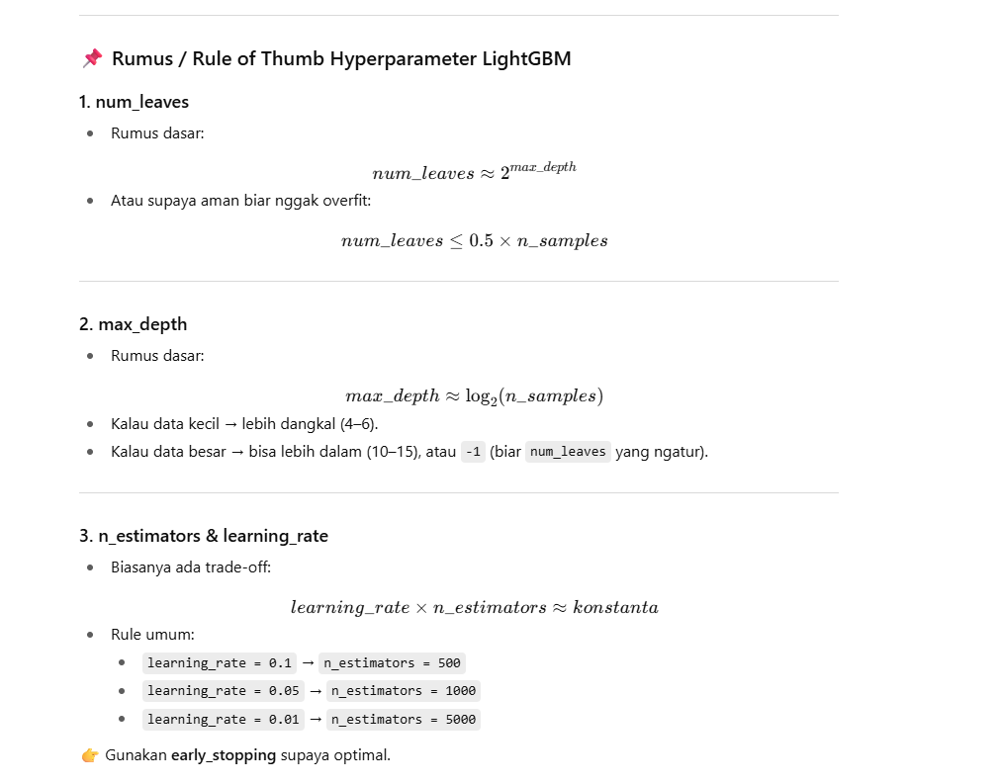

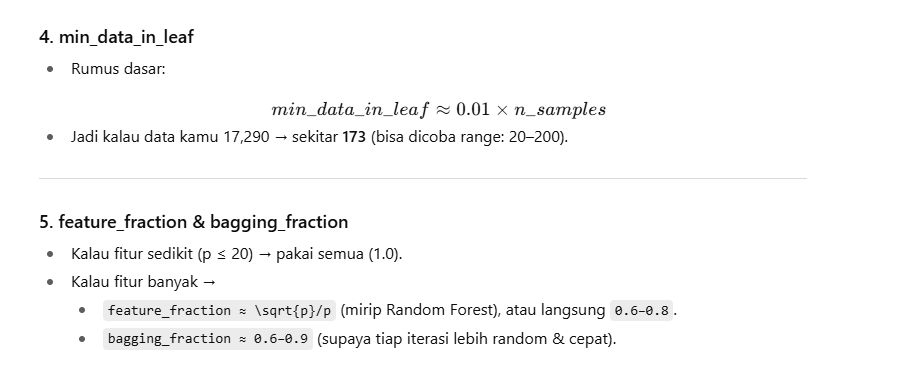

In [68]:
import lightgbm as lgb
from sklearn.metrics import mean_squared_error, mean_absolute_error, r2_score
from math import sqrt
import numpy as np
import pandas as pd
from itertools import product

# Range parameter (rule of thumb → bisa sesuaikan dengan dataset kamu)
learning_rate_range = [0.05, 0.1]       # kecil dataset → lebih besar
num_leaves_range = [31, 63, 127, 255, 511]        # sesuai max_depth
max_depth_range = [6, 10, 14,-1]  #-1 maksudnya biar numleaves yg ngontrol
min_data_in_leaf_range = [50, 100,200]  # kecil dataset → kecil juga
n_estimators_range = [500, 1000]

# List simpan hasil
results_lgb = []

for lr, leaves, depth, min_leaf, n_est in product(
    learning_rate_range,
    num_leaves_range,
    max_depth_range,
    min_data_in_leaf_range,
    n_estimators_range
):
    # Inisialisasi model
    model = lgb.LGBMRegressor(
        learning_rate=lr,
        num_leaves=leaves,
        max_depth=depth,
        min_data_in_leaf=min_leaf,
        n_estimators=n_est,
        random_state=42,
        n_jobs=-1
    )
    
    # Fit model
    model.fit(X_train_concat, y_train)
    
    # Prediksi
    y_train_pred = model.predict(X_train_concat)
    y_test_pred = model.predict(X_test_concat)
    
    # Evaluasi train
    mse_train = mean_squared_error(y_train, y_train_pred)
    rmse_train = sqrt(mse_train)
    mae_train = mean_absolute_error(y_train, y_train_pred)
    r2_train = r2_score(y_train, y_train_pred)
    
    # Evaluasi test
    mse_test = mean_squared_error(y_test, y_test_pred)
    rmse_test = sqrt(mse_test)
    mae_test = mean_absolute_error(y_test, y_test_pred)
    r2_test = r2_score(y_test, y_test_pred)
    
    # MAPE
    mape_train = np.mean(np.abs((y_train - y_train_pred) / y_train)) * 100
    mape_test = np.mean(np.abs((y_test - y_test_pred) / y_test)) * 100
    
    # Simpan hasil
    results_lgb.append({
        'learning_rate': lr,
        'num_leaves': leaves,
        'max_depth': depth,
        'min_data_in_leaf': min_leaf,
        'n_estimators': n_est,
        'MAE_train': mae_train,
        'MAE_test': mae_test,
        'MAPE_train': mape_train,
        'MAPE_test': mape_test,
        'MSE_train': mse_train,
        'MSE_test': mse_test,
        'RMSE_train': rmse_train,
        'RMSE_test': rmse_test,
        'R2_train': r2_train,
        'R2_test': r2_test,
        'R2_gap': r2_train - r2_test
    })



[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000911 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2631
[LightGBM] [Info] Number of data points in the train set: 17290, number of used features: 29
[LightGBM] [Info] Start training from score 537768.047947
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

In [70]:
# Jadi DataFrame
df_results_lgb = pd.DataFrame(results_lgb)

# Urutkan misalnya berdasarkan R2_test terbesar
df_results_lgb.sort_values(by="R2_test", ascending=False).head(10)
df_results_lgb


,learning_rate,num_leaves,max_depth,min_data_in_leaf,n_estimators,MAE_train,MAE_test,MAPE_train,MAPE_test,MSE_train,MSE_test,RMSE_train,RMSE_test,R2_train,R2_test,R2_gap
0,0.05,31,6,50,500,8352.274589,10726.614502,1.445289,1.673249,1.115401e+09,1.689881e+09,33397.626713,41108.164147,0.991463,0.988822,0.002641
1,0.05,31,6,50,1000,7636.485836,10585.665242,1.349857,1.621022,6.348388e+08,1.702831e+09,25196.007479,41265.376660,0.995141,0.988736,0.006405
2,0.05,31,6,100,500,10906.802891,12441.714240,1.675709,1.815661,2.374925e+09,2.535272e+09,48733.205540,50351.486651,0.981822,0.983230,-0.001408
3,0.05,31,6,100,1000,10099.060332,12116.929779,1.581133,1.773429,1.641758e+09,2.199049e+09,40518.618312,46894.013504,0.987434,0.985454,0.001980
4,0.05,31,6,200,500,13207.700003,15397.716105,1.969858,2.128542,3.944234e+09,3.835781e+09,62803.139378,61933.686046,0.969810,0.974627,-0.004817
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
235,0.10,511,-1,50,1000,1561.185492,9372.460299,0.167963,1.206349,1.745748e+08,1.802530e+09,13212.675149,42456.207522,0.998664,0.988077,0.010587
236,0.10,511,-1,100,500,5967.541906,10470.121508,0.713955,1.324477,1.564493e+09,2.347649e+09,39553.675900,48452.543459,0.988025,0.984471,0.003554
237,0.10,511,-1,100,1000,4598.751189,10868.904186,0.529520,1.355812,8.426833e+08,2.500612e+09,29029.007930,50006.115350,0.993550,0.983459,0.010091
238,0.10,511,-1,200,500,9292.090104,12363.145339,1.211545,1.608626,2.715412e+09,2.705636e+09,52109.616438,52015.731636,0.979216,0.982103,-0.002887


In [71]:
# Langsung inisialisasi best params
best_model = lgb.LGBMRegressor(
    learning_rate=0.05,
    num_leaves=31,
    max_depth=6,
    min_data_in_leaf=50,
    n_estimators=500,
    random_state=42,
    n_jobs=-1
)

# Fit
best_model.fit(X_train_concat, y_train)

# Prediksi
y_train_pred = best_model.predict(X_train_concat)
y_test_pred = best_model.predict(X_test_concat)

# Evaluasi
print("MAE Train:", mean_absolute_error(y_train, y_train_pred))
print("MAE Test:", mean_absolute_error(y_test, y_test_pred))
print("RMSE Train:", np.sqrt(mean_squared_error(y_train, y_train_pred)))
print("RMSE Test:", np.sqrt(mean_squared_error(y_test, y_test_pred)))
print("R2 Train:", r2_score(y_train, y_train_pred))
print("R2 Test:", r2_score(y_test, y_test_pred))


[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Warning] min_data_in_leaf is set=50, min_child_samples=20 will be ignored. Current value: min_data_in_leaf=50
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.001052 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 2631
[LightGBM] [Info] Number of data points in the train set: 17290, number of used features: 29
[LightGBM] [Info] Start training from score 537768.047947
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further sp

c:\Users\ASUS\anaconda3\envs\boosting_and_clustering\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


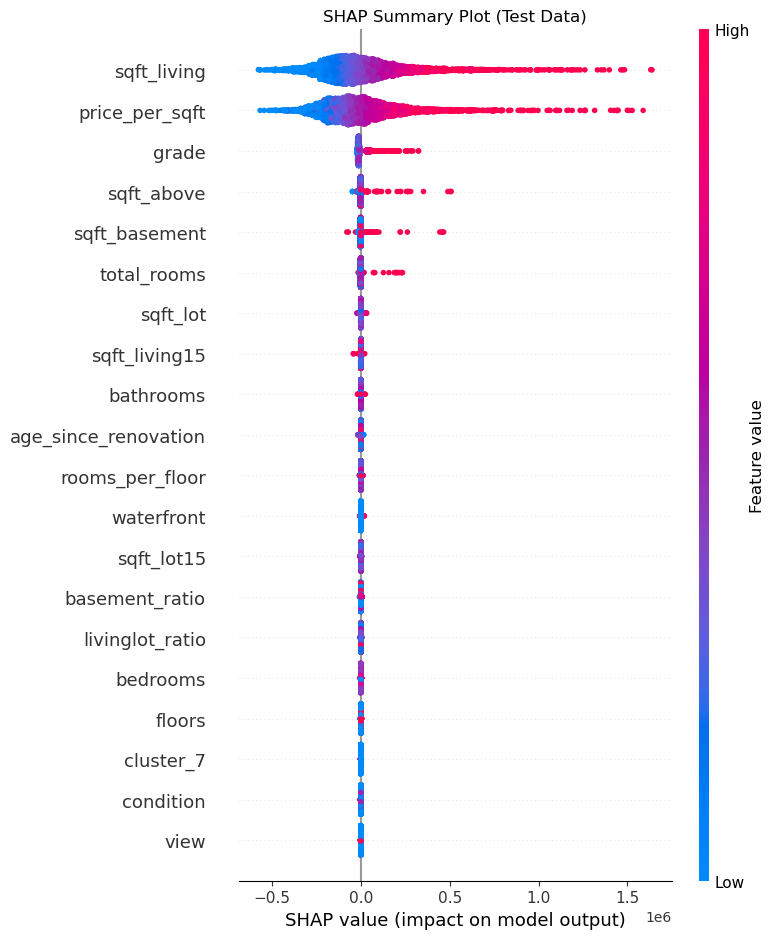

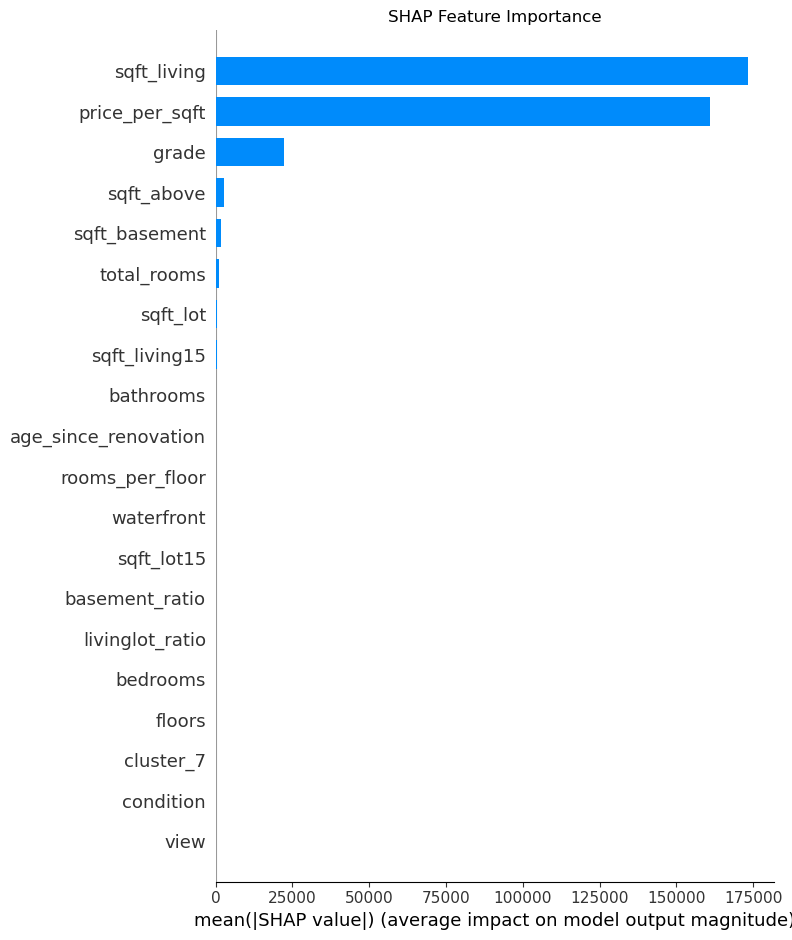

In [72]:
import shap
import matplotlib.pyplot as plt

# === SHAP Explainer ===
explainer = shap.TreeExplainer(best_model)
shap_values = explainer.shap_values(X_test_concat)

# === Summary Plot (beeswarm) ===
plt.title("SHAP Summary Plot (Test Data)")
shap.summary_plot(shap_values, X_test_concat)

# === Bar Plot (mean absolute SHAP value) ===
plt.title("SHAP Feature Importance")
shap.summary_plot(shap_values, X_test_concat, plot_type="bar")


In [73]:
X_train_concat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 17290 entries, 0 to 17289
Data columns (total 29 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   sqft_lot              17290 non-null  float64
 1   sqft_lot15            17290 non-null  float64
 2   livinglot_ratio       17290 non-null  float64
 3   bedrooms              17290 non-null  float64
 4   bathrooms             17290 non-null  float64
 5   sqft_living           17290 non-null  float64
 6   floors                17290 non-null  float64
 7   sqft_above            17290 non-null  float64
 8   sqft_basement         17290 non-null  float64
 9   sqft_living15         17290 non-null  float64
 10  age_since_renovation  17290 non-null  float64
 11  total_rooms           17290 non-null  float64
 12  price_per_sqft        17290 non-null  float64
 13  rooms_per_floor       17290 non-null  float64
 14  basement_ratio        17290 non-null  float64
 15  waterfront         

In [74]:
import joblib

# Simpan model LightGBM
joblib.dump(best_model, 'best_model_lgb.pkl')  

# Simpan preprocessor scaler (numeric features)
joblib.dump(preprocessor, 'preprocessor.pkl')  

# Simpan encoder kategorikal
joblib.dump(encoder, 'encoder.pkl')  

# Simpan urutan kolom akhir (supaya prediksi konsisten)
columns_order = X_train_concat.columns.tolist()
joblib.dump(columns_order, 'columns_order.pkl')  

# Ambil index medoids dari hasil clustering
medoid_indices = medoids   # ini hasil kmedoids_instance.get_medoids()

# Ambil koordinat medoids (lat, long)
medoid_coords = df[['lat','long']].iloc[medoid_indices].to_numpy()

# Simpan koordinat medoids (bukan index)
joblib.dump(medoid_coords, 'kmedoids_medoids.pkl')


['kmedoids_medoids.pkl']

In [75]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21613 entries, 0 to 21612
Data columns (total 24 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   price                 21613 non-null  float64
 1   bedrooms              21613 non-null  int64  
 2   bathrooms             21613 non-null  float64
 3   sqft_living           21613 non-null  int64  
 4   sqft_lot              21613 non-null  int64  
 5   floors                21613 non-null  float64
 6   waterfront            21613 non-null  int64  
 7   view                  21613 non-null  int64  
 8   condition             21613 non-null  int64  
 9   grade                 21613 non-null  int64  
 10  sqft_above            21613 non-null  int64  
 11  sqft_basement         21613 non-null  int64  
 12  lat                   21613 non-null  float64
 13  long                  21613 non-null  float64
 14  sqft_living15         21613 non-null  int64  
 15  sqft_lot15         